In [1]:
!pip install earthengine-api --quiet

import ee
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import urllib.request
import os



[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [2]:
# Parameters
EXPORT_FOLDER = "harvest_images"
os.makedirs(EXPORT_FOLDER, exist_ok=True)


In [3]:
# Load NDVI CSV
ndvi_df = pd.read_csv("/work/ndvi_output_2024 (4).csv")
ndvi_df['NDVI_Date'] = pd.to_datetime(ndvi_df['NDVI_Date'])
ndvi_df['Unique_Farmer'] = ndvi_df['Farmer_Name'].str.strip() + " | " + ndvi_df['Father_Name'].str.strip()


In [4]:
# Identify minimum NDVI (Harvest Date)
harvest_df = ndvi_df.loc[ndvi_df.groupby(['Unique_Farmer', 'Plot No'])['NDVI'].idxmin()].copy()
harvest_df = harvest_df[['Farmer_Name', 'Father_Name', 'Plot No', 'NDVI_Date', 'NDVI']]
harvest_df = harvest_df.rename(columns={'NDVI_Date': 'Harvest_Date'})


KeyboardInterrupt: 

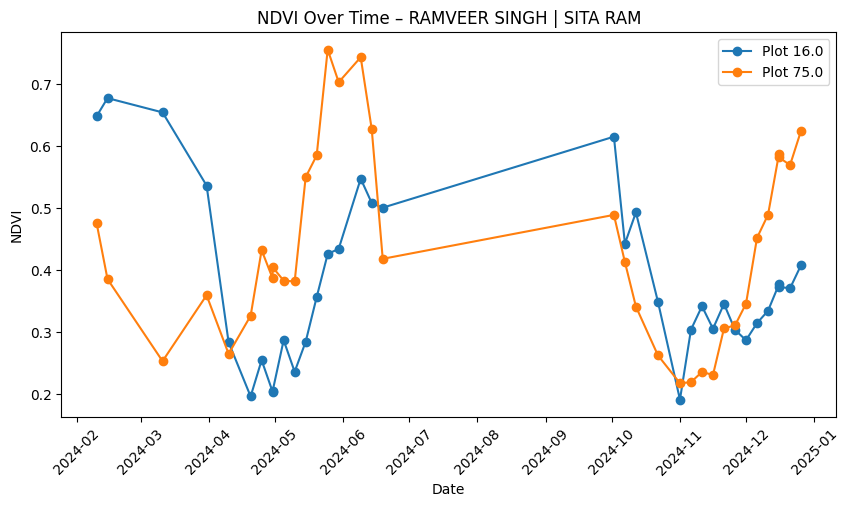

In [5]:
# Plot Graphs for each farmer
graph_records = []

for (farmer, father), group in ndvi_df.groupby(['Farmer_Name', 'Father_Name']):
    plt.figure(figsize=(10, 5))
    for plot_no, plot_data in group.groupby('Plot No'):
        plt.plot(plot_data['NDVI_Date'], plot_data['NDVI'], label=f'Plot {plot_no}', marker='o')

    plt.legend()
    plt.title(f'NDVI Over Time – {farmer} | {father}')
    plt.xlabel('Date')
    plt.ylabel('NDVI')
    plt.xticks(rotation=45)
    filename = f"{farmer}_{father}_graph.png".replace(" ", "_")
    plt.savefig(filename)
    plt.close()

    graph_records.append({
        'Farmer_Name': farmer,
        'Father_Name': father,
        'Graph_File': filename
    })

# Save graph metadata
graph_df = pd.DataFrame(graph_records)
graph_df.to_csv("graphs.csv", index=False)


In [23]:
# Save final harvest date CSV
harvest_df.to_csv("harvest_dates.csv", index=False)
print("Saved 'harvest_dates.csv'")
import os
print(os.listdir())


import os

# Step 1: Create a folder named 'outputs' if it doesn't exist
output_folder = "outputs"
os.makedirs(output_folder, exist_ok=True)

# Step 2: Save the CSV into that folder
csv_path = os.path.join(output_folder, "harvest_dates.csv")
harvest_df.to_csv(csv_path, index=False)

print(f"Saved harvest_dates.csv to: {csv_path}")

print("Files in outputs/:", os.listdir("outputs"))

import base64
from IPython.display import HTML

def create_download_link(filename):
    with open(filename, "rb") as f:
        data = f.read()
    b64 = base64.b64encode(data).decode()
    href = f'<a href="data:text/csv;base64,{b64}" download="{filename}">Click here to download {filename}</a>'
    return HTML(href)

# Generate the download link
create_download_link("outputs/harvest_dates.csv")

Saved 'harvest_dates.csv'
['AJAY_KUMAR_SHARMA_RAM_KUMAR_SHARMA_graph.png', 'AKSHAY_KUMAR_UMESHCHAND_graph.png', 'ANCHIT_DHARMENDER_SING_graph.png', 'ANEKPAL_JAYVEER_graph.png', 'ANEKPAL_SINGH_RAGHUVEER_SINGH_graph.png', 'ANIL_KUMAR_JAYVEER_SINGH_graph.png', 'ANKITCHAUDHARY_DHARMENDER_graph.png', 'ASHA_DEVI_UMESH_CHANDRA_SHARMA_graph.png', 'ASIESH_SHARMA_UMESHCHAND_graph.png', 'BALBEER_SINGH_UDAL_SINGH_graph.png', 'BALRAM_SHARMA_UDAL_PRASAD_graph.png', 'BAVITA_DHARMENDRA_graph.png', 'BECHA_MURADI_graph.png', 'BHAGWAN_DAS_MATRU_graph.png', 'BHAGWATI_OMPRAKASH_graph.png', 'BHOOP_SINGH_JANKI_graph.png', 'BHOOP_SINGH_LAKHAN_SINGH_graph.png', 'BHOURI_RAMOTAR_graph.png', 'BHURA_GIRDHARI_graph.png', 'BHURI_MUNNU_graph.png', 'BRIJESH_KUMAR_RAMSEWAK_graph.png', 'CHANDER_PAL_HARDWARI_graph.png', 'CHANDER_PAL_SIN_BAHORAN_SING_graph.png', 'CHUTTAN_SHUMBA_graph.png', 'DALCHAND_DHANNU_SINGH_graph.png', 'DANVEER_SINGH_RAMESH_graph.png', 'DEVI_SINGH_ROOM_SINGH_graph.png', 'DHARAMPAL_SINGH_TIRATH_SINGH_

In [26]:
import os
import zipfile
import base64
from IPython.display import HTML

# Step 1: Define folder and output zip name
image_folder = "."
zip_filename = "graph_images.zip"

# Step 2: Create a ZIP file of all *_graph.png files
with zipfile.ZipFile(zip_filename, "w") as zipf:
    for file in os.listdir(image_folder):
        if file.endswith("_graph.png"):
            zipf.write(os.path.join(image_folder, file), arcname=file)

print(f"Zipped files to: {zip_filename}")

# Step 3: Create an HTML download link
def create_download_link(filename):
    with open(filename, "rb") as f:
        data = f.read()
    b64 = base64.b64encode(data).decode()
    href = f'<a href="data:application/zip;base64,{b64}" download="{filename}">Click here to download {filename}</a>'
    return HTML(href)

# Step 4: Show download link
create_download_link(zip_filename)


Zipped files to: graph_images.zip


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=f3ed0e34-c91c-458b-8b78-13dd8685b260' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>